### Tweeter NLP Data
#### 1. Imports and EDA

In [1]:
# !pip install scikit-learn-intelex
# !pip freeze | grep -E 'ydata-profiling|visions'

In [2]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from ydata_profiling.config import Settings

import nltk
from nltk.corpus import stopwords
import re
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Sklearn imports
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

# Support Vector Optimizers
from sklearnex import patch_sklearn
patch_sklearn()
from sklearn.svm import SVC

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import TruncatedSVD

config = Settings()
# Disable chi-square test for numeric variables
config.vars.num.chi_squared_threshold = 0.0

%load_ext autoreload
%autoreload 2
%matplotlib inline

df_raw = pd.read_csv('./data/nlp_tweet/tweet_data.csv')
df = df_raw.copy()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)


In [3]:
df.sample(15).T

,62260,442659,135123,444331,594166,761063,245744,625928,400342,110130,396912,425581,452019,598081,449883
tweetID,1080631358173499392,1121645678378115072,1088925900375117825,1121903693778051072,1138208991010545671,1152250122241224706,1101828150881906688,1140952303320670209,1117567050816401414,1085948111577645056,1117147434273189893,1120164874791768064,1122931093248851969,1138519788454535168,1122735799336935424
crDate,2019-01-03 01:06:07,2019-04-26 05:22:23,2019-01-25 22:25:40,2019-04-26 22:27:39,2019-06-10 22:19:05,2019-07-19 16:13:31,2019-03-02 12:54:36,2019-06-18 12:00:01,2019-04-14 23:15:22,2019-01-17 17:13:00,2019-04-13 19:27:58,2019-04-22 03:18:12,2019-04-29 18:30:10,2019-06-11 18:54:04,2019-04-29 05:34:08
edInput,-1,-1,1,1,1,1,1,1,-1,-1,2,2,1,1,1
editor,-1,-1,5001,5004,5008,5007,5001,5008,-1,-1,5002,5002,5004,5008,5004
engages,13,22,641,232,228,31,84,2586,19,5,0,1383,64,18,56
isApproved,False,False,True,True,True,True,True,True,False,False,False,False,True,True,True
isEdNeed,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
isRT,True,True,True,True,False,True,False,False,False,False,False,False,False,False,False
likes,6,20,465,140,158,26,77,2261,13,3,0,1045,46,13,31
photoUrl,https://pbs.twimg.com/media/Dv8scxAUUAA2RbE.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://pbs.twimg.com/media/D4JlT1uXkAEnVPD.jpg,https://pbs.twimg.com/media/DxCn0ALWwAUyEMd.jpg,https://pbs.twimg.com/media/D4Dnp0hWsAEFrA3.jpg,NaN,NaN,NaN,NaN


In [4]:
# Runs Auto-EDA of data, see tweet_EDA_report.html in project folder magnimind_projects
# profile = ProfileReport(df, title='Tweet Profile Report', explorative=True, config=config)
# profile.to_file('tweet_EDA_report.html')

### 2. Feature Selections and Word Cloud

In [5]:
df_reduced = df[['editor', 'topicName', 'text', 'edInput']].copy()
df_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785916 entries, 0 to 785915
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   editor     785916 non-null  int64 
 1   topicName  785916 non-null  object
 2   text       785916 non-null  object
 3   edInput    785916 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 24.0+ MB


In [6]:
# nltk.download('stopwords')

In [7]:
stop_words = set(stopwords.words('english'))

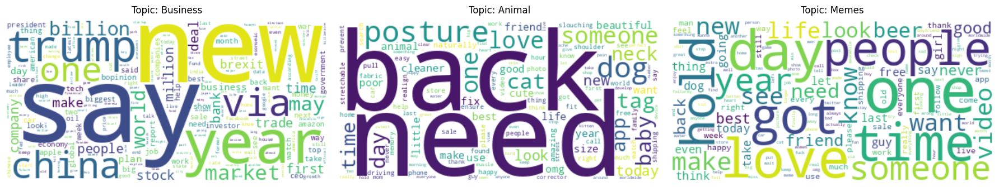

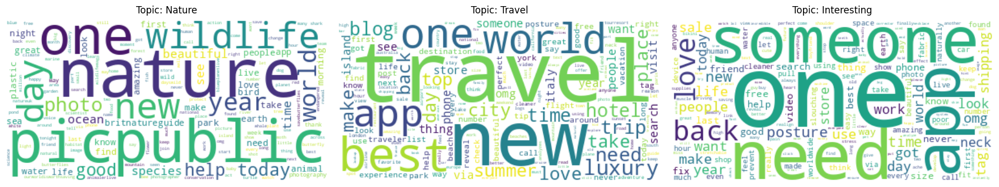

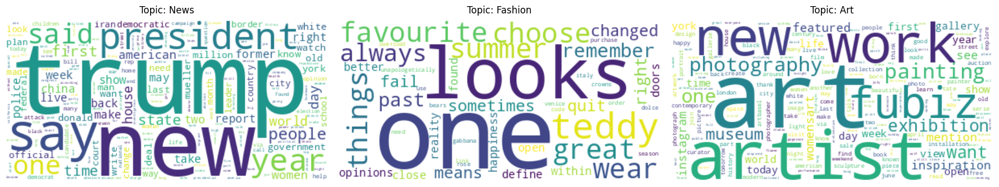

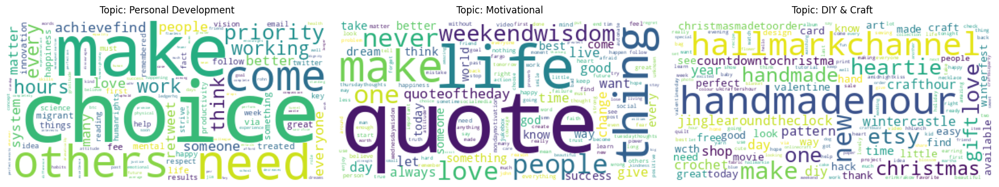

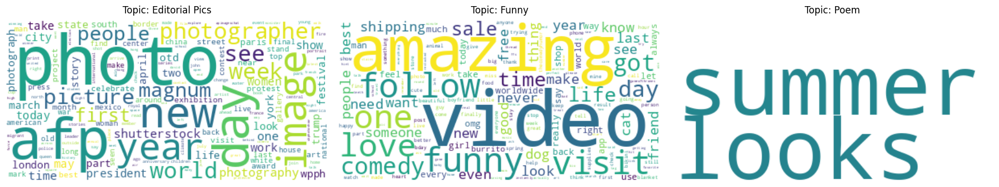

...

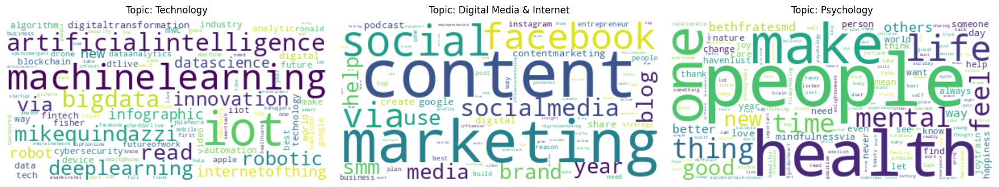

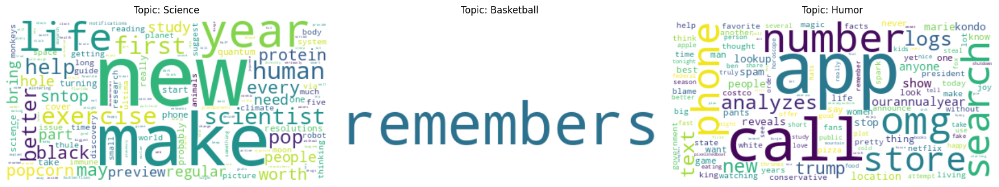

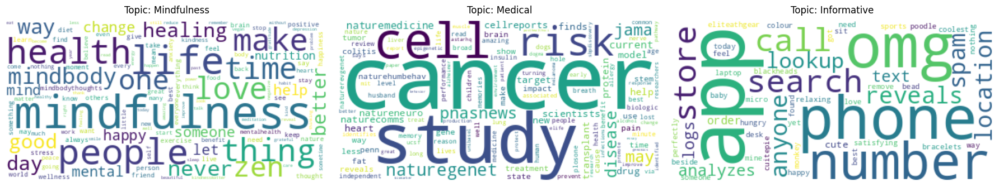

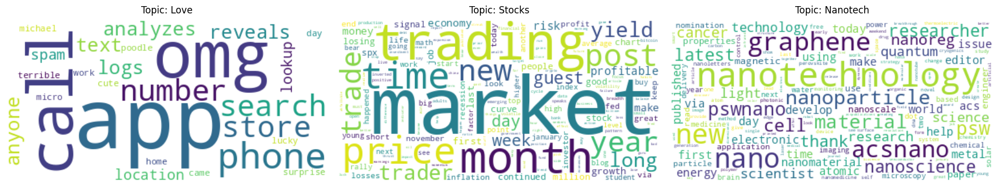

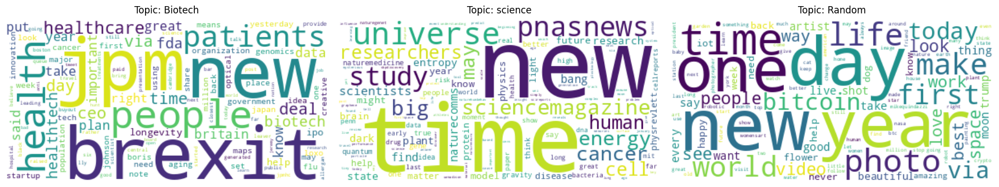

In [8]:
# Define a text-cleaning function
# Generate word clouds for each topicName
# We group rows by topicName, concatenate the cleaned text, and make a WordCloud.

stop_words = set(stopwords.words('english'))

def cleanup_text(text):
    # Remove URLs
    text = re.sub(r'https?://\S+', '', text)
    # Keep only letters + whitespace; make lowercase
    text = re.sub(r'[^a-zA-Z\s]', ' ', text).lower()
    # Tokenize on whitespace
    tokens = text.split()
    # Remove stopwords
    tokens = [t for t in tokens if t not in stop_words]
    # Keep tokens > 2 characters, purely alphabetical
    tokens = [t for t in tokens if t.isalpha() and len(t) > 2]
    return ' '.join(tokens)

df_reduced['cleaned_text'] = df_reduced['text'].apply(cleanup_text)

topics = df_reduced['topicName'].unique()

chunk_size = 3
for i in range(0, len(topics), chunk_size):
    # For this figure, grab up to 3 topics
    chunk = topics[i:i+chunk_size]
    
    # Create one figure to hold up to 3 columns
    # Adjust figsize as you like
    fig = plt.figure(figsize=(18, 6))

    for j, topic in enumerate(chunk):
        # Gather text for this topic
        group = df_reduced[df_reduced['topicName'] == topic]
        all_text = " ".join(group['cleaned_text'])
        
        # Generate the word cloud
        wordcloud = WordCloud(background_color='white', 
                              collocations=False
                             ).generate(all_text)
        
        # Manually place an Axes in the figure:
        # e.g., 3 columns => each ~0.33 wide
        left = 0.01 + 0.33*j   # shift each axis horizontally
        ax = fig.add_axes([left, 0.05, 0.32, 0.85]) 
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.set_title(f"Topic: {topic}", pad=10)
        ax.axis("off")
    
    # Show the figure for this set of 3 topics
    plt.show()
    plt.close(fig)

### 3. Predict edInput

In [9]:
df_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785916 entries, 0 to 785915
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   editor        785916 non-null  int64 
 1   topicName     785916 non-null  object
 2   text          785916 non-null  object
 3   edInput       785916 non-null  int64 
 4   cleaned_text  785916 non-null  object
dtypes: int64(2), object(3)
memory usage: 30.0+ MB


In [10]:
df_model = df_reduced[['editor', 'topicName', 'cleaned_text', 'edInput']].copy()
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785916 entries, 0 to 785915
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   editor        785916 non-null  int64 
 1   topicName     785916 non-null  object
 2   cleaned_text  785916 non-null  object
 3   edInput       785916 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 24.0+ MB


In [11]:
df_model['edInput'].value_counts()

edInput
-1    422665
 1    215577
 2    106741
 4     32733
 3      8200
Name: count, dtype: int64

In [12]:
# Remap the edInput values
# Original: -1, 1, 2, 3, 4
# Map:      3,  1, 2, 3, 3
# So any of {-1, 3, 4} --> 3
df_model['edInput'] = df_model['edInput'].replace({-1:3, 3:3, 4:3})  # (-1,3,4 => 3; 1 => 1; 2 => 2)

# Confirm the remapping worked:
df_model['edInput'].value_counts()

edInput
3    463598
1    215577
2    106741
Name: count, dtype: int64

In [ ]:
# Suppose y has values {1,2,3}.
# Map them to {0,1,2}.
df_model['edInput'] = df_model['edInput'].replace({1:0, 2:1, 3:2})

# Define your features (X) and target (y)
X = df_model[['editor', 'topicName', 'cleaned_text']]
y = df_model['edInput']

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,       # 20% test
    random_state=42,
    stratify=y           # keep class proportions
)

# Build the sub-pipeline for text (cleaned_text)
#     - TF-IDF vectorization
#     - PCA to reduce dimensionality
#     - StandardScaler to normalize the resulting PCA components
text_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_features=300)),       # limit features for memory reasons, tweak as needed
    ('svd', TruncatedSVD(n_components=23)),             # reduce dimensionality
    # ('pca', PCA(n_components=23)),                      # reduce text dimensionality, tweak as needed, mle = auto
    ('scaler', StandardScaler())                        # standardize the 50 PCA components
])

# Sub-pipeline for categorical columns
cat_pipeline = Pipeline([
    ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=True))
])

# Combine the two sub-pipelines with a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('text', text_pipeline, 'cleaned_text'),
        ('cat', cat_pipeline, ['editor', 'topicName'])
    ],
    remainder='drop'
)

# Fit multiple models and show classification reports
models = {
    'LogisticRegression': LogisticRegression(max_iter=1000, class_weight='balanced',),
    'SVM': SVC(class_weight='balanced',),  # by default, SVC() = SVC(kernel='rbf')
    'RandomForest': RandomForestClassifier(class_weight='balanced', n_jobs=-1),
    'XGBoost': XGBClassifier(class_weight='balanced', use_label_encoder=False, eval_metric='mlogloss', n_jobs=-1)
}

for model_name, model in models.items():
    print(f"\n=== {model_name} ===")
    
    # Build a pipeline for each model
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('oversample', SMOTE()),
        ('classifier', model)
    ])
    
    # Fit on training data
    pipeline.fit(X_train, y_train)
    
    # Predict on test data
    y_pred = pipeline.predict(X_test)
    
    # Print classification metrics
    print(classification_report(y_test, y_pred))


=== LogisticRegression ===
              precision    recall  f1-score   support

           0       0.77      0.67      0.71     43116
           1       0.46      0.76      0.57     21348
           2       1.00      0.91      0.95     92720

    accuracy                           0.82    157184
   macro avg       0.74      0.78      0.75    157184
weighted avg       0.86      0.82      0.84    157184


=== SVM ===
